In [1]:
import time
import os
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

from keras.models import Sequential
from keras.layers import Conv2D, Conv2DTranspose, Reshape
from keras.layers import Flatten, BatchNormalization, Dense, Activation
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

Using TensorFlow backend.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
import os
import cv2

from sklearn.model_selection import train_test_split

In [4]:
path=os.path.join('gdrive','My Drive','indian_car')
path

'gdrive/My Drive/indian_car'

In [0]:
def load_dataset(dataset_path, batch_size, image_shape):
    dataset_generator = ImageDataGenerator()
    print(dataset_path, image_shape)
    dataset_generator = dataset_generator.flow_from_directory(
        dataset_path, target_size=(image_shape[0], image_shape[1]),
        batch_size=batch_size,
        class_mode=None)
    print(dataset_generator)
    return dataset_generator

In [0]:
# Creates the discriminator model. This model tries to classify images as real
# or fake.
def construct_discriminator(image_shape):

    discriminator = Sequential()
    discriminator.add(Conv2D(filters=64, kernel_size=(5, 5),
                             strides=(2, 2), padding='same',
                             data_format='channels_last',
                             kernel_initializer='glorot_uniform',
                             input_shape=(image_shape)))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Conv2D(filters=128, kernel_size=(5, 5),
                             strides=(2, 2), padding='same',
                             data_format='channels_last',
                             kernel_initializer='glorot_uniform'))
    discriminator.add(BatchNormalization(momentum=0.5))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Conv2D(filters=256, kernel_size=(5, 5),
                             strides=(2, 2), padding='same',
                             data_format='channels_last',
                             kernel_initializer='glorot_uniform'))
    discriminator.add(BatchNormalization(momentum=0.5))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Conv2D(filters=512, kernel_size=(5, 5),
                             strides=(2, 2), padding='same',
                             data_format='channels_last',
                             kernel_initializer='glorot_uniform'))
    discriminator.add(BatchNormalization(momentum=0.5))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Flatten())
    discriminator.add(Dense(1))
    discriminator.add(Activation('sigmoid'))

    optimizer = Adam(lr=0.0002, beta_1=0.5)
    discriminator.compile(loss='binary_crossentropy',
                          optimizer=optimizer,
                          metrics=None)

    return discriminator

In [0]:
# Creates the generator model. This model has an input of random noise and
# generates an image that will try mislead the discriminator.
def construct_generator():

    generator = Sequential()

    generator.add(Dense(units=4 * 4 * 512,
                        kernel_initializer='glorot_uniform',
                        input_shape=(1, 1, 100)))
    generator.add(Reshape(target_shape=(4, 4, 512)))
    generator.add(BatchNormalization(momentum=0.5))
    generator.add(Activation('relu'))

    generator.add(Conv2DTranspose(filters=256, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
    generator.add(BatchNormalization(momentum=0.5))
    generator.add(Activation('relu'))

    generator.add(Conv2DTranspose(filters=128, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
    generator.add(BatchNormalization(momentum=0.5))
    generator.add(Activation('relu'))

    generator.add(Conv2DTranspose(filters=64, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
    generator.add(BatchNormalization(momentum=0.5))
    generator.add(Activation('relu'))

    generator.add(Conv2DTranspose(filters=3, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
    generator.add(Activation('tanh'))

    optimizer = Adam(lr=0.00015, beta_1=0.5)
    generator.compile(loss='binary_crossentropy',
                      optimizer=optimizer,
                      metrics=None)

    return generator


In [0]:
# Displays a figure of the generated images and saves them in as .png image
def save_generated_images(generated_images, epoch, batch_number):

    plt.figure(figsize=(8, 8), num=2)
    gs1 = gridspec.GridSpec(8, 8)
    gs1.update(wspace=0, hspace=0)

    for i in range(16):
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        image = generated_images[i, :, :, :]
        image += 1
        image *= 127.5
        fig = plt.imshow(image.astype(np.uint8))
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)

    plt.tight_layout()
    save_name = 'gdrive/My Drive/indian_car/generated_images/generatedSamples_epoch' + str(
        epoch + 1) + '_batch' + str(batch_number + 1) + '.png'

    plt.savefig(save_name, bbox_inches='tight', pad_inches=0)
    plt.pause(0.0000000001)
    plt.show()

In [0]:
# Main train function
def train_dcgan(batch_size, epochs, image_shape, dataset_path):
    # Build the adversarial model that consists in the generator output
    # connected to the discriminator
    generator = construct_generator()
    discriminator = construct_discriminator(image_shape)

    gan = Sequential()
    # Only false for the adversarial model
    discriminator.trainable = False
    gan.add(generator)
    gan.add(discriminator)

    optimizer = Adam(lr=0.00015, beta_1=0.5)
    gan.compile(loss='binary_crossentropy', optimizer=optimizer,
                metrics=None)

    # Create a dataset Generator with help of keras
    dataset_generator = load_dataset(dataset_path, batch_size, image_shape)

    # 11788 is the total number of images on the bird dataset
    number_of_batches = int(144 / batch_size)

    # Variables that will be used to plot the losses from the discriminator and
    # the adversarial models
    adversarial_loss = np.empty(shape=1)
    discriminator_loss = np.empty(shape=1)
    batches = np.empty(shape=1)

    # Allo plot updates inside for loop
    plt.ion()

    current_batch = 0

    # Let's train the DCGAN for n epochs
    for epoch in range(epochs):

        print("Epoch " + str(epoch+1) + "/" + str(epochs) + " :")

        for batch_number in range(number_of_batches):

            start_time = time.time()

            # Get the current batch and normalize the images between -1 and 1
            real_images = dataset_generator.next()
            real_images /= 127.5
            real_images -= 1

            # The last batch is smaller than the other ones, so we need to
            # take that into account
            current_batch_size = real_images.shape[0]

            # Generate noise
            noise = np.random.normal(0, 1,
                                     size=(current_batch_size,) + (1, 1, 100))

            # Generate images
            generated_images = generator.predict(noise)

            # Add some noise to the labels that will be
            # fed to the discriminator
            real_y = (np.ones(current_batch_size) -
                      np.random.random_sample(current_batch_size) * 0.2)
            fake_y = np.random.random_sample(current_batch_size) * 0.2

            # Let's train the discriminator
            discriminator.trainable = True

            d_loss = discriminator.train_on_batch(real_images, real_y)
            d_loss += discriminator.train_on_batch(generated_images, fake_y)

            discriminator_loss = np.append(discriminator_loss, d_loss)

            # Now it's time to train the generator
            discriminator.trainable = False

            noise = np.random.normal(0, 1,
                                     size=(current_batch_size * 2,) +
                                     (1, 1, 100))

            # We try to mislead the discriminator by giving the opposite labels
            fake_y = (np.ones(current_batch_size * 2) -
                      np.random.random_sample(current_batch_size * 2) * 0.2)

            g_loss = gan.train_on_batch(noise, fake_y)
            adversarial_loss = np.append(adversarial_loss, g_loss)
            batches = np.append(batches, current_batch)

            # Each 50 batches show and save images
            if((batch_number + 1) % 5 == 0 and
               current_batch_size == batch_size):
                save_generated_images(generated_images, epoch, batch_number)

            time_elapsed = time.time() - start_time

            # Display and plot the results
            print("     Batch " + str(batch_number + 1) + "/" +
                  str(number_of_batches) +
                  " generator loss | discriminator loss : " +
                  str(g_loss) + " | " + str(d_loss) + ' - batch took ' +
                  str(time_elapsed) + ' s.')

            current_batch += 1

        # Save the model weights each 5 epochs
        if (epoch + 1) % 5 == 0:
            discriminator.trainable = True
            generator.save('gdrive/My Drive/indian_car/models/generator_epoch' + str(epoch) + '.hdf5')
            discriminator.save('gdrive/My Drive/indian_car/models/discriminator_epoch' +
                               str(epoch) + '.hdf5')

        # Each epoch update the loss graphs
        plt.figure(1)
        plt.plot(batches, adversarial_loss, color='green',
                 label='Generator Loss')
        plt.plot(batches, discriminator_loss, color='blue',
                 label='Discriminator Loss')
        plt.title("DCGAN Train")
        plt.xlabel("Batch Iteration")
        plt.ylabel("Loss")
        if epoch == 0:
            plt.legend()
        plt.pause(0.0000000001)
        plt.show()
        plt.savefig('trainingLossPlot.png')

gdrive/My Drive/indian_car
gdrive/My Drive/indian_car













Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
gdrive/My Drive/indian_car (64, 64, 3)
Found 144 images belonging to 4 classes.
Epoch 1/50 :


     Batch 1/9 generator loss | discriminator loss : 3.594245 | 5.3091445 - batch took 6.994767189025879 s.
     Batch 2/9 generator loss | discriminator loss : 5.2459874 | 1.3591101 - batch took 2.786853075027466 s.
     Batch 3/9 generator loss | discriminator loss : 9.142042 | 2.3675497 - batch took 2.8729395866394043 s.
     Batch 4/9 generator loss | discriminator loss : 7.9991345 | 1.7120767 - batch took 2.809204339981079 s.


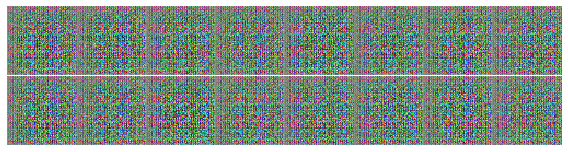

     Batch 5/9 generator loss | discriminator loss : 12.0630865 | 2.891687 - batch took 3.48341965675354 s.
     Batch 6/9 generator loss | discriminator loss : 14.24126 | 2.2855465 - batch took 3.0765044689178467 s.
     Batch 7/9 generator loss | discriminator loss : 5.224708 | 2.127684 - batch took 2.792778253555298 s.
     Batch 8/9 generator loss | discriminator loss : 12.20746 | 7.200263 - batch took 2.7877349853515625 s.
     Batch 9/9 generator loss | discriminator loss : 14.134095 | 2.7116992 - batch took 2.8882808685302734 s.


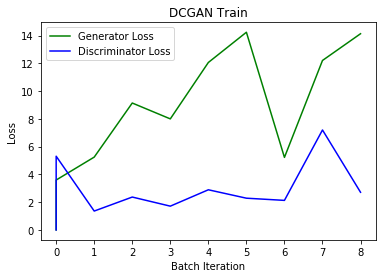

Epoch 2/50 :
     Batch 1/9 generator loss | discriminator loss : 11.792578 | 3.2337718 - batch took 2.7616119384765625 s.
     Batch 2/9 generator loss | discriminator loss : 1.8084941 | 1.2063602 - batch took 2.809814691543579 s.
     Batch 3/9 generator loss | discriminator loss : 14.206861 | 5.841621 - batch took 2.7887964248657227 s.
     Batch 4/9 generator loss | discriminator loss : 14.370804 | 3.6877503 - batch took 2.8038368225097656 s.


<Figure size 432x288 with 0 Axes>

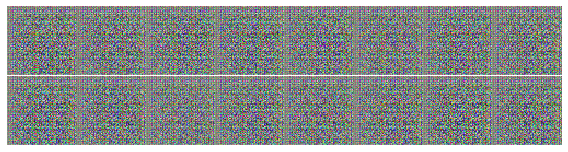

     Batch 5/9 generator loss | discriminator loss : 14.452562 | 2.7101235 - batch took 3.4999139308929443 s.
     Batch 6/9 generator loss | discriminator loss : 14.442043 | 2.3642898 - batch took 2.8634965419769287 s.
     Batch 7/9 generator loss | discriminator loss : 14.52507 | 3.0085006 - batch took 2.838538408279419 s.
     Batch 8/9 generator loss | discriminator loss : 14.569113 | 1.871951 - batch took 2.7915492057800293 s.
     Batch 9/9 generator loss | discriminator loss : 14.23464 | 1.8194246 - batch took 2.9321861267089844 s.


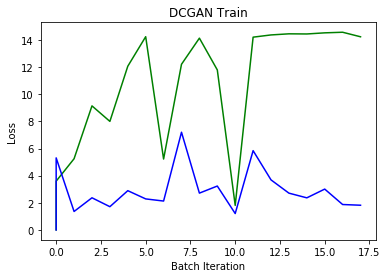

Epoch 3/50 :
     Batch 1/9 generator loss | discriminator loss : 14.688314 | 2.279877 - batch took 2.876840829849243 s.
     Batch 2/9 generator loss | discriminator loss : 14.320996 | 1.5982913 - batch took 2.9618306159973145 s.
     Batch 3/9 generator loss | discriminator loss : 14.4524 | 2.419431 - batch took 2.7712955474853516 s.
     Batch 4/9 generator loss | discriminator loss : 14.32436 | 1.7798462 - batch took 2.7839431762695312 s.


<Figure size 432x288 with 0 Axes>

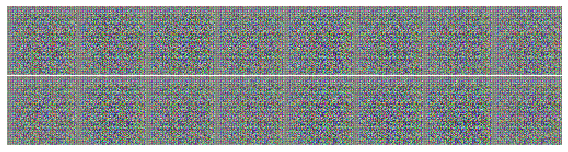

     Batch 5/9 generator loss | discriminator loss : 14.266002 | 2.3856926 - batch took 3.6670327186584473 s.
     Batch 6/9 generator loss | discriminator loss : 14.293606 | 2.4342084 - batch took 3.0196568965911865 s.
     Batch 7/9 generator loss | discriminator loss : 14.352383 | 2.0199876 - batch took 2.7983386516571045 s.
     Batch 8/9 generator loss | discriminator loss : 14.471102 | 1.6980768 - batch took 2.802194595336914 s.
     Batch 9/9 generator loss | discriminator loss : 14.600812 | 1.9448255 - batch took 2.833951950073242 s.


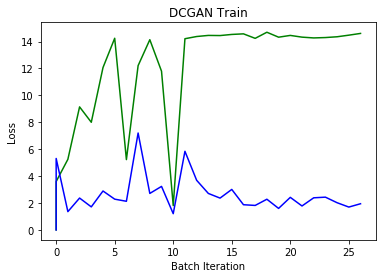

Epoch 4/50 :
     Batch 1/9 generator loss | discriminator loss : 14.5569935 | 2.6595664 - batch took 2.7929816246032715 s.
     Batch 2/9 generator loss | discriminator loss : 14.831071 | 2.2349153 - batch took 2.7876460552215576 s.
     Batch 3/9 generator loss | discriminator loss : 14.468349 | 2.5498977 - batch took 2.9031777381896973 s.
     Batch 4/9 generator loss | discriminator loss : 14.342342 | 1.9015987 - batch took 3.047658681869507 s.


<Figure size 432x288 with 0 Axes>

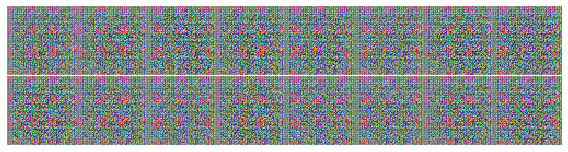

     Batch 5/9 generator loss | discriminator loss : 14.1943245 | 2.0567272 - batch took 3.721106767654419 s.
     Batch 6/9 generator loss | discriminator loss : 14.185213 | 2.1976016 - batch took 3.0184590816497803 s.
     Batch 7/9 generator loss | discriminator loss : 14.391346 | 2.0186298 - batch took 3.028911828994751 s.
     Batch 8/9 generator loss | discriminator loss : 14.273743 | 2.3014722 - batch took 2.8008322715759277 s.
     Batch 9/9 generator loss | discriminator loss : 14.545326 | 2.1318784 - batch took 2.8190360069274902 s.


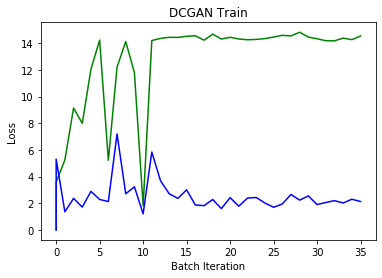

Epoch 5/50 :
     Batch 1/9 generator loss | discriminator loss : 14.472476 | 1.926445 - batch took 2.8011581897735596 s.
     Batch 2/9 generator loss | discriminator loss : 14.436845 | 2.6188238 - batch took 2.9001927375793457 s.
     Batch 3/9 generator loss | discriminator loss : 14.28364 | 2.1177201 - batch took 2.974663019180298 s.
     Batch 4/9 generator loss | discriminator loss : 14.666501 | 2.496974 - batch took 2.874330520629883 s.


<Figure size 432x288 with 0 Axes>

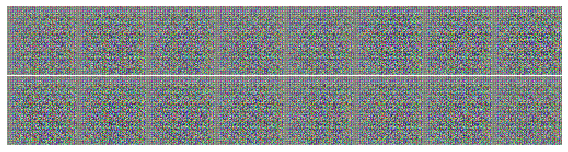

     Batch 5/9 generator loss | discriminator loss : 14.571814 | 1.6841676 - batch took 3.5523040294647217 s.
     Batch 6/9 generator loss | discriminator loss : 14.551885 | 2.415337 - batch took 2.9453585147857666 s.
     Batch 7/9 generator loss | discriminator loss : 14.219994 | 1.7132083 - batch took 3.117286443710327 s.
     Batch 8/9 generator loss | discriminator loss : 14.515593 | 1.9774034 - batch took 2.930111885070801 s.
     Batch 9/9 generator loss | discriminator loss : 14.602032 | 1.6634061 - batch took 3.1610524654388428 s.


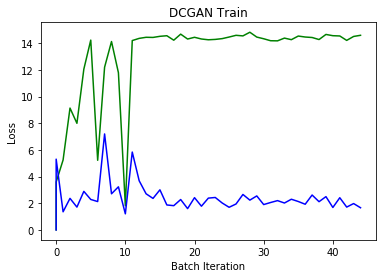

Epoch 6/50 :
     Batch 1/9 generator loss | discriminator loss : 14.855254 | 1.7743249 - batch took 2.854703187942505 s.
     Batch 2/9 generator loss | discriminator loss : 14.551993 | 2.119345 - batch took 2.9556522369384766 s.
     Batch 3/9 generator loss | discriminator loss : 14.442328 | 2.1385598 - batch took 3.000661611557007 s.
     Batch 4/9 generator loss | discriminator loss : 14.296921 | 2.3097022 - batch took 3.077975034713745 s.


<Figure size 432x288 with 0 Axes>

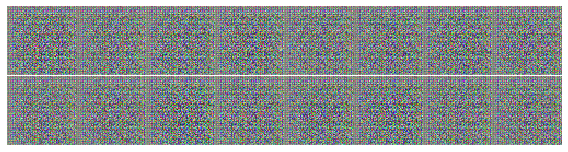

     Batch 5/9 generator loss | discriminator loss : 14.663153 | 1.9140043 - batch took 3.7749292850494385 s.
     Batch 6/9 generator loss | discriminator loss : 14.478939 | 2.543964 - batch took 3.0501489639282227 s.
     Batch 7/9 generator loss | discriminator loss : 14.439726 | 2.4819462 - batch took 2.9600460529327393 s.
     Batch 8/9 generator loss | discriminator loss : 14.11297 | 2.519709 - batch took 2.831977128982544 s.
     Batch 9/9 generator loss | discriminator loss : 6.4237986 | 1.8489059 - batch took 2.928502321243286 s.


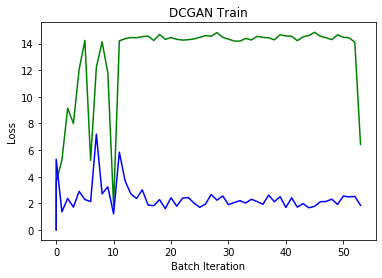

Epoch 7/50 :
     Batch 1/9 generator loss | discriminator loss : 14.2091255 | 4.3738036 - batch took 2.9148716926574707 s.
     Batch 2/9 generator loss | discriminator loss : 14.13052 | 3.381725 - batch took 2.913407802581787 s.
     Batch 3/9 generator loss | discriminator loss : 14.499443 | 2.4913716 - batch took 2.9451401233673096 s.
     Batch 4/9 generator loss | discriminator loss : 14.655426 | 1.7056181 - batch took 2.8438847064971924 s.


<Figure size 432x288 with 0 Axes>

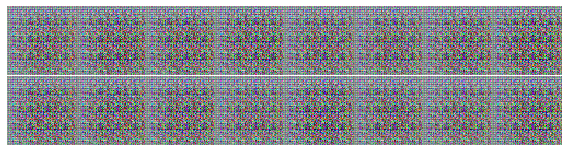

     Batch 5/9 generator loss | discriminator loss : 14.576322 | 2.1396365 - batch took 3.4951605796813965 s.
     Batch 6/9 generator loss | discriminator loss : 14.631642 | 2.6318145 - batch took 2.825793743133545 s.
     Batch 7/9 generator loss | discriminator loss : 14.422615 | 2.255485 - batch took 2.8593382835388184 s.
     Batch 8/9 generator loss | discriminator loss : 14.6303215 | 2.554341 - batch took 2.7869386672973633 s.
     Batch 9/9 generator loss | discriminator loss : 14.456116 | 2.206691 - batch took 2.8317723274230957 s.


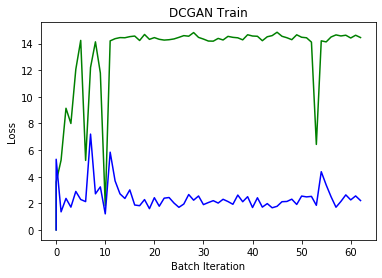

Epoch 8/50 :
     Batch 1/9 generator loss | discriminator loss : 14.611792 | 2.4567852 - batch took 2.852677822113037 s.
     Batch 2/9 generator loss | discriminator loss : 14.42325 | 2.167282 - batch took 2.831538438796997 s.
     Batch 3/9 generator loss | discriminator loss : 14.350668 | 2.0936038 - batch took 2.813994884490967 s.
     Batch 4/9 generator loss | discriminator loss : 14.578972 | 2.1289086 - batch took 2.81827974319458 s.


<Figure size 432x288 with 0 Axes>

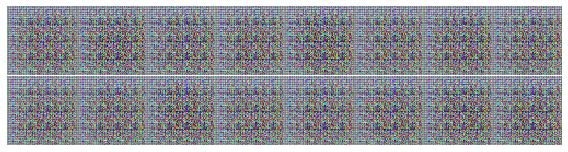

     Batch 5/9 generator loss | discriminator loss : 14.533979 | 1.3144433 - batch took 3.5252652168273926 s.
     Batch 6/9 generator loss | discriminator loss : 14.348601 | 1.9325513 - batch took 2.8376967906951904 s.
     Batch 7/9 generator loss | discriminator loss : 14.3232975 | 2.3717184 - batch took 2.9038329124450684 s.
     Batch 8/9 generator loss | discriminator loss : 14.914236 | 2.0211847 - batch took 2.8565926551818848 s.
     Batch 9/9 generator loss | discriminator loss : 14.490698 | 2.0941064 - batch took 2.823885917663574 s.


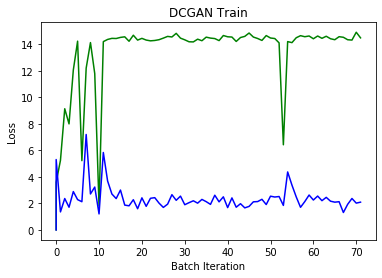

Epoch 9/50 :
     Batch 1/9 generator loss | discriminator loss : 14.456297 | 2.3019922 - batch took 2.80059552192688 s.
     Batch 2/9 generator loss | discriminator loss : 14.674486 | 1.5287652 - batch took 2.7867352962493896 s.
     Batch 3/9 generator loss | discriminator loss : 14.54315 | 2.2812948 - batch took 2.957674741744995 s.
     Batch 4/9 generator loss | discriminator loss : 14.747523 | 2.1020288 - batch took 2.774468183517456 s.


<Figure size 432x288 with 0 Axes>

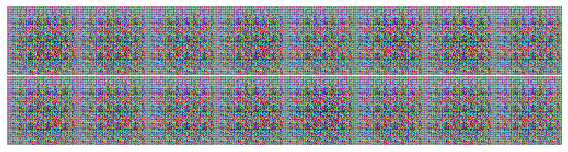

     Batch 5/9 generator loss | discriminator loss : 14.485569 | 1.6115954 - batch took 3.686561107635498 s.
     Batch 6/9 generator loss | discriminator loss : 14.5220375 | 1.8873738 - batch took 2.8767735958099365 s.
     Batch 7/9 generator loss | discriminator loss : 14.822631 | 2.3262465 - batch took 2.8496015071868896 s.
     Batch 8/9 generator loss | discriminator loss : 14.473246 | 1.8661511 - batch took 3.0480799674987793 s.
     Batch 9/9 generator loss | discriminator loss : 14.769742 | 1.9456141 - batch took 2.8734989166259766 s.


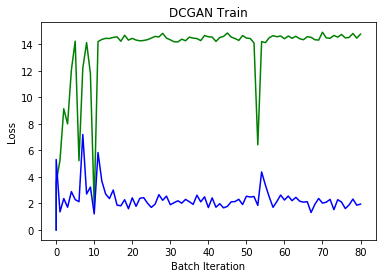

Epoch 10/50 :
     Batch 1/9 generator loss | discriminator loss : 14.255312 | 1.5768787 - batch took 3.0213675498962402 s.
     Batch 2/9 generator loss | discriminator loss : 14.662278 | 1.6697184 - batch took 2.8799824714660645 s.
     Batch 3/9 generator loss | discriminator loss : 14.635451 | 2.0310721 - batch took 3.009403705596924 s.
     Batch 4/9 generator loss | discriminator loss : 14.420139 | 1.7393324 - batch took 2.8242180347442627 s.


<Figure size 432x288 with 0 Axes>

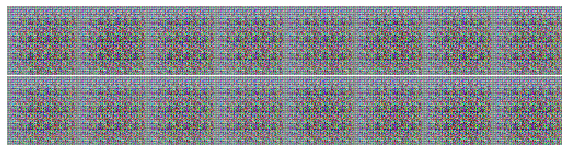

     Batch 5/9 generator loss | discriminator loss : 14.196715 | 1.4523263 - batch took 3.4826602935791016 s.
     Batch 6/9 generator loss | discriminator loss : 14.627312 | 1.9232694 - batch took 2.8436286449432373 s.
     Batch 7/9 generator loss | discriminator loss : 14.470703 | 2.113521 - batch took 2.849327802658081 s.
     Batch 8/9 generator loss | discriminator loss : 14.513489 | 2.6389236 - batch took 2.874809741973877 s.
     Batch 9/9 generator loss | discriminator loss : 14.303915 | 2.3247368 - batch took 2.772303819656372 s.


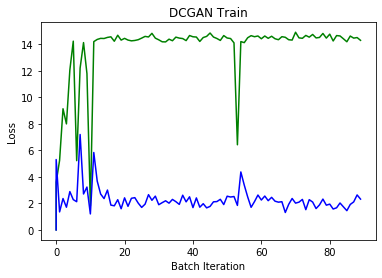

Epoch 11/50 :
     Batch 1/9 generator loss | discriminator loss : 14.695141 | 1.9657675 - batch took 2.7915990352630615 s.
     Batch 2/9 generator loss | discriminator loss : 14.646944 | 1.7867093 - batch took 2.7841832637786865 s.
     Batch 3/9 generator loss | discriminator loss : 14.374601 | 2.4131784 - batch took 2.8006787300109863 s.
     Batch 4/9 generator loss | discriminator loss : 14.218413 | 2.2185588 - batch took 3.0434417724609375 s.


<Figure size 432x288 with 0 Axes>

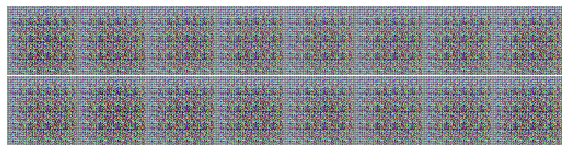

     Batch 5/9 generator loss | discriminator loss : 14.5460825 | 2.0370436 - batch took 3.481949806213379 s.
     Batch 6/9 generator loss | discriminator loss : 14.225405 | 1.8706691 - batch took 2.884739398956299 s.
     Batch 7/9 generator loss | discriminator loss : 14.480995 | 2.3810687 - batch took 2.768035650253296 s.
     Batch 8/9 generator loss | discriminator loss : 14.804409 | 1.8430331 - batch took 2.7483115196228027 s.
     Batch 9/9 generator loss | discriminator loss : 14.515751 | 2.0211205 - batch took 2.7778661251068115 s.


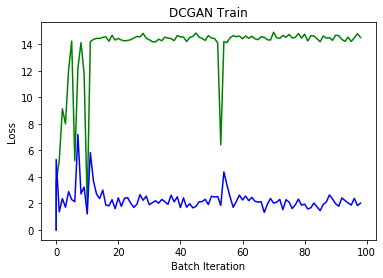

Epoch 12/50 :
     Batch 1/9 generator loss | discriminator loss : 14.448687 | 1.5873508 - batch took 2.7900140285491943 s.
     Batch 2/9 generator loss | discriminator loss : 14.653873 | 1.9624286 - batch took 2.9222068786621094 s.
     Batch 3/9 generator loss | discriminator loss : 14.566405 | 1.9774166 - batch took 2.863156318664551 s.
     Batch 4/9 generator loss | discriminator loss : 14.528848 | 2.0180967 - batch took 2.7643001079559326 s.


<Figure size 432x288 with 0 Axes>

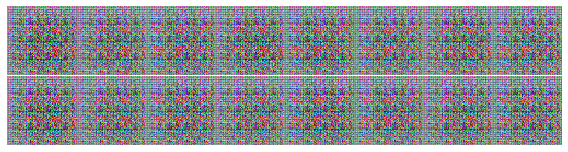

     Batch 5/9 generator loss | discriminator loss : 14.621727 | 1.718667 - batch took 3.5041801929473877 s.
     Batch 6/9 generator loss | discriminator loss : 14.726859 | 1.838337 - batch took 2.838547706604004 s.
     Batch 7/9 generator loss | discriminator loss : 14.554826 | 1.9625313 - batch took 2.8103349208831787 s.
     Batch 8/9 generator loss | discriminator loss : 14.419791 | 2.1353202 - batch took 2.787524700164795 s.
     Batch 9/9 generator loss | discriminator loss : 14.33946 | 2.0148752 - batch took 2.7645270824432373 s.


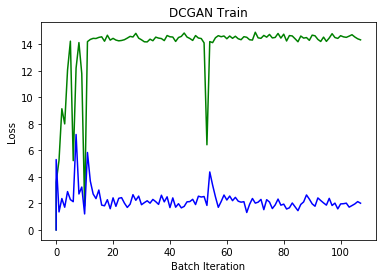

Epoch 13/50 :
     Batch 1/9 generator loss | discriminator loss : 14.756411 | 1.9881504 - batch took 2.7991037368774414 s.
     Batch 2/9 generator loss | discriminator loss : 14.488741 | 1.5848622 - batch took 2.771761417388916 s.
     Batch 3/9 generator loss | discriminator loss : 14.402794 | 2.1994517 - batch took 2.7937228679656982 s.
     Batch 4/9 generator loss | discriminator loss : 14.3755245 | 2.0503602 - batch took 2.78005051612854 s.


<Figure size 432x288 with 0 Axes>

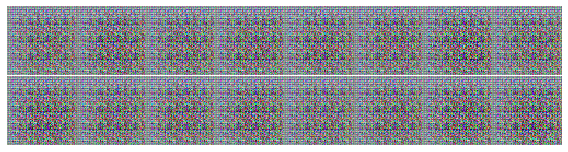

     Batch 5/9 generator loss | discriminator loss : 14.324383 | 2.3870037 - batch took 3.6872706413269043 s.
     Batch 6/9 generator loss | discriminator loss : 14.579538 | 2.0111458 - batch took 2.8273017406463623 s.
     Batch 7/9 generator loss | discriminator loss : 14.489708 | 1.9672225 - batch took 2.7988948822021484 s.
     Batch 8/9 generator loss | discriminator loss : 14.50515 | 2.2996168 - batch took 2.814591646194458 s.
     Batch 9/9 generator loss | discriminator loss : 14.554693 | 1.7139546 - batch took 2.80145001411438 s.


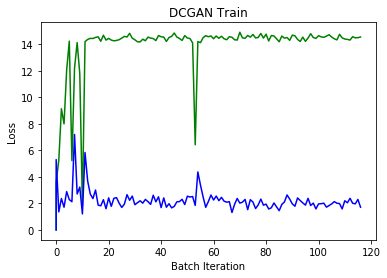

Epoch 14/50 :
     Batch 1/9 generator loss | discriminator loss : 14.466358 | 1.9314682 - batch took 2.8565895557403564 s.
     Batch 2/9 generator loss | discriminator loss : 14.37756 | 1.9989152 - batch took 2.7983672618865967 s.
     Batch 3/9 generator loss | discriminator loss : 14.338669 | 1.737217 - batch took 2.7563605308532715 s.
     Batch 4/9 generator loss | discriminator loss : 14.601488 | 1.7833186 - batch took 2.7755112648010254 s.


<Figure size 432x288 with 0 Axes>

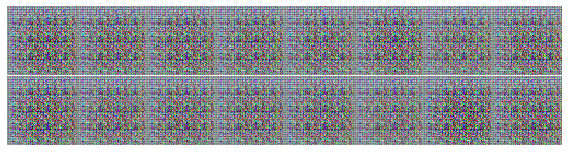

     Batch 5/9 generator loss | discriminator loss : 14.174179 | 1.829798 - batch took 3.4668614864349365 s.
     Batch 6/9 generator loss | discriminator loss : 14.385003 | 2.176373 - batch took 2.9639320373535156 s.
     Batch 7/9 generator loss | discriminator loss : 14.418947 | 1.8832384 - batch took 2.7461931705474854 s.
     Batch 8/9 generator loss | discriminator loss : 14.376427 | 2.4483569 - batch took 2.7891666889190674 s.
     Batch 9/9 generator loss | discriminator loss : 14.318588 | 2.2378173 - batch took 2.8160526752471924 s.


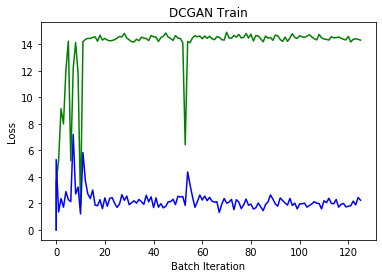

Epoch 15/50 :
     Batch 1/9 generator loss | discriminator loss : 14.681921 | 2.0276797 - batch took 2.760080337524414 s.
     Batch 2/9 generator loss | discriminator loss : 14.5954685 | 1.9270835 - batch took 2.7958619594573975 s.
     Batch 3/9 generator loss | discriminator loss : 14.53293 | 1.9321338 - batch took 2.84617018699646 s.
     Batch 4/9 generator loss | discriminator loss : 14.523016 | 1.9706671 - batch took 2.8123772144317627 s.


<Figure size 432x288 with 0 Axes>

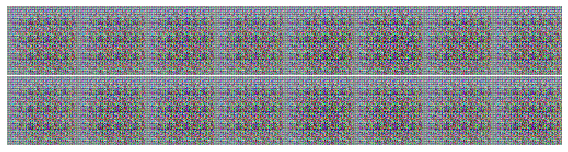

     Batch 5/9 generator loss | discriminator loss : 14.424031 | 1.9551495 - batch took 3.4485924243927 s.
     Batch 6/9 generator loss | discriminator loss : 14.37295 | 1.6750426 - batch took 2.955425500869751 s.
     Batch 7/9 generator loss | discriminator loss : 14.54266 | 1.6562154 - batch took 2.841679334640503 s.
     Batch 8/9 generator loss | discriminator loss : 14.446419 | 1.8621058 - batch took 2.831321954727173 s.
     Batch 9/9 generator loss | discriminator loss : 14.60635 | 2.0316122 - batch took 2.7779996395111084 s.


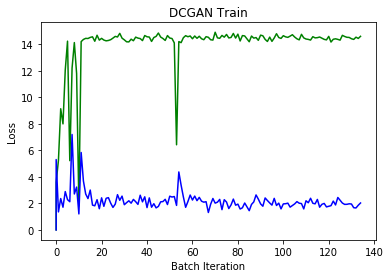

Epoch 16/50 :
     Batch 1/9 generator loss | discriminator loss : 14.480047 | 2.0491996 - batch took 2.9390218257904053 s.
     Batch 2/9 generator loss | discriminator loss : 14.375086 | 1.8083673 - batch took 2.9107141494750977 s.
     Batch 3/9 generator loss | discriminator loss : 14.741419 | 1.9986932 - batch took 2.787517547607422 s.
     Batch 4/9 generator loss | discriminator loss : 14.332478 | 2.1233132 - batch took 3.032933473587036 s.


<Figure size 432x288 with 0 Axes>

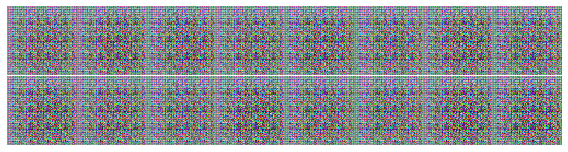

     Batch 5/9 generator loss | discriminator loss : 14.246949 | 1.9598517 - batch took 3.6505191326141357 s.
     Batch 6/9 generator loss | discriminator loss : 14.740891 | 1.8592469 - batch took 2.8137571811676025 s.
     Batch 7/9 generator loss | discriminator loss : 14.692636 | 1.9711051 - batch took 2.7388381958007812 s.
     Batch 8/9 generator loss | discriminator loss : 14.606857 | 1.9573761 - batch took 2.8008010387420654 s.
     Batch 9/9 generator loss | discriminator loss : 14.44029 | 2.472077 - batch took 2.784226417541504 s.


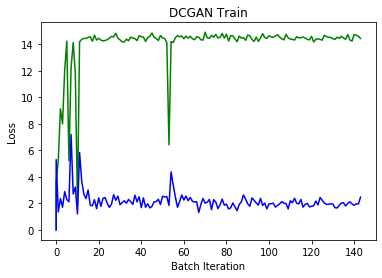

Epoch 17/50 :
     Batch 1/9 generator loss | discriminator loss : 14.274427 | 1.4787552 - batch took 2.755687952041626 s.
     Batch 2/9 generator loss | discriminator loss : 14.769779 | 1.8262666 - batch took 2.7925710678100586 s.
     Batch 3/9 generator loss | discriminator loss : 14.315284 | 2.1668992 - batch took 2.8934175968170166 s.
     Batch 4/9 generator loss | discriminator loss : 14.696297 | 1.9045402 - batch took 2.7789061069488525 s.


<Figure size 432x288 with 0 Axes>

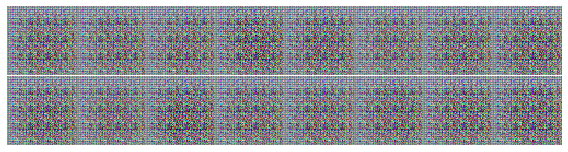

     Batch 5/9 generator loss | discriminator loss : 14.823372 | 2.1137419 - batch took 3.4580624103546143 s.
     Batch 6/9 generator loss | discriminator loss : 14.82798 | 1.8073769 - batch took 2.939579963684082 s.
     Batch 7/9 generator loss | discriminator loss : 14.790851 | 2.1964316 - batch took 2.8511128425598145 s.
     Batch 8/9 generator loss | discriminator loss : 14.675648 | 1.7665282 - batch took 2.7427778244018555 s.
     Batch 9/9 generator loss | discriminator loss : 14.626411 | 1.5308433 - batch took 2.802107572555542 s.


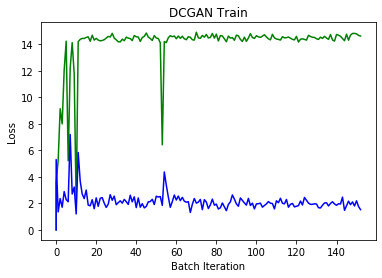

Epoch 18/50 :
     Batch 1/9 generator loss | discriminator loss : 14.601374 | 1.7325592 - batch took 2.856238603591919 s.
     Batch 2/9 generator loss | discriminator loss : 14.620012 | 2.0491712 - batch took 2.8202435970306396 s.
     Batch 3/9 generator loss | discriminator loss : 14.637459 | 1.843376 - batch took 2.950408458709717 s.
     Batch 4/9 generator loss | discriminator loss : 14.480991 | 1.8434514 - batch took 2.9372310638427734 s.


<Figure size 432x288 with 0 Axes>

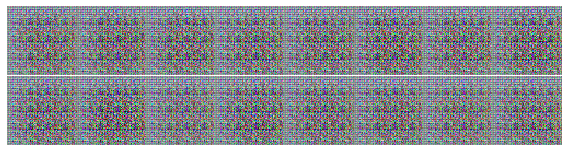

     Batch 5/9 generator loss | discriminator loss : 14.512048 | 2.260683 - batch took 3.5063488483428955 s.
     Batch 6/9 generator loss | discriminator loss : 14.402147 | 1.5436363 - batch took 2.984126091003418 s.
     Batch 7/9 generator loss | discriminator loss : 14.816424 | 2.1553688 - batch took 2.7655606269836426 s.
     Batch 8/9 generator loss | discriminator loss : 14.3815 | 2.3101149 - batch took 2.7790496349334717 s.
     Batch 9/9 generator loss | discriminator loss : 14.641394 | 2.4912605 - batch took 2.774986743927002 s.


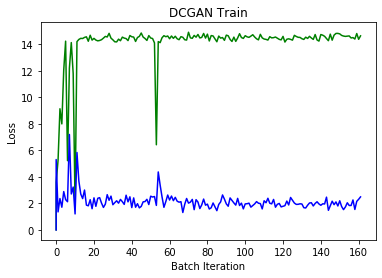

Epoch 19/50 :
     Batch 1/9 generator loss | discriminator loss : 14.549427 | 1.9906675 - batch took 2.766263008117676 s.
     Batch 2/9 generator loss | discriminator loss : 14.569587 | 1.697501 - batch took 2.7819340229034424 s.
     Batch 3/9 generator loss | discriminator loss : 14.270031 | 1.5889393 - batch took 2.757209539413452 s.
     Batch 4/9 generator loss | discriminator loss : 14.328508 | 1.8500555 - batch took 2.7896227836608887 s.


<Figure size 432x288 with 0 Axes>

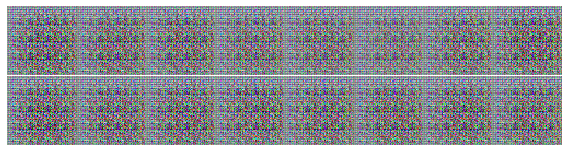

     Batch 5/9 generator loss | discriminator loss : 14.547152 | 2.0699575 - batch took 3.64627742767334 s.
     Batch 6/9 generator loss | discriminator loss : 14.516751 | 2.2827978 - batch took 2.8636298179626465 s.
     Batch 7/9 generator loss | discriminator loss : 14.664444 | 1.8369334 - batch took 2.78031587600708 s.
     Batch 8/9 generator loss | discriminator loss : 14.367748 | 2.1315966 - batch took 2.77854585647583 s.
     Batch 9/9 generator loss | discriminator loss : 14.821852 | 2.0446491 - batch took 2.767557382583618 s.


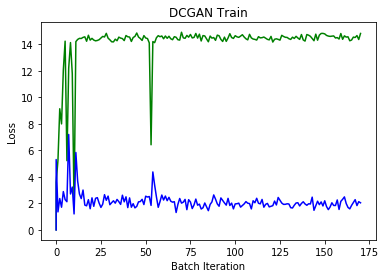

Epoch 20/50 :
     Batch 1/9 generator loss | discriminator loss : 14.457568 | 2.0856376 - batch took 2.795915365219116 s.
     Batch 2/9 generator loss | discriminator loss : 14.395921 | 1.6416638 - batch took 2.834542989730835 s.
     Batch 3/9 generator loss | discriminator loss : 14.605114 | 1.8819637 - batch took 2.7522027492523193 s.
     Batch 4/9 generator loss | discriminator loss : 14.4407425 | 2.1531637 - batch took 2.8089993000030518 s.


<Figure size 432x288 with 0 Axes>

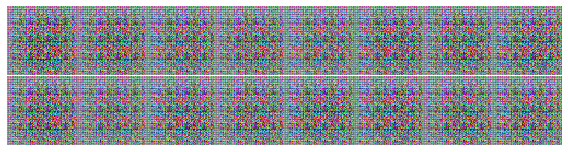

     Batch 5/9 generator loss | discriminator loss : 14.478731 | 1.9371414 - batch took 3.5132594108581543 s.
     Batch 6/9 generator loss | discriminator loss : 14.823652 | 1.8046846 - batch took 2.922076463699341 s.
     Batch 7/9 generator loss | discriminator loss : 14.518055 | 1.8818303 - batch took 2.7741012573242188 s.
     Batch 8/9 generator loss | discriminator loss : 14.408194 | 1.6059515 - batch took 2.7728466987609863 s.
     Batch 9/9 generator loss | discriminator loss : 14.586773 | 1.5953431 - batch took 2.912583112716675 s.


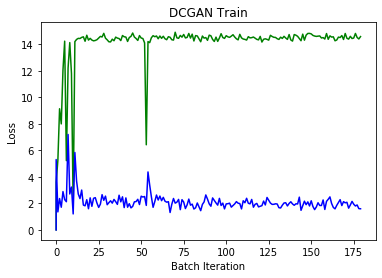

Epoch 21/50 :
     Batch 1/9 generator loss | discriminator loss : 14.44341 | 2.42309 - batch took 2.865870237350464 s.
     Batch 2/9 generator loss | discriminator loss : 14.608441 | 1.7809131 - batch took 2.8090999126434326 s.
     Batch 3/9 generator loss | discriminator loss : 14.511318 | 1.5502493 - batch took 2.8060848712921143 s.
     Batch 4/9 generator loss | discriminator loss : 14.501591 | 2.026939 - batch took 2.9818248748779297 s.


<Figure size 432x288 with 0 Axes>

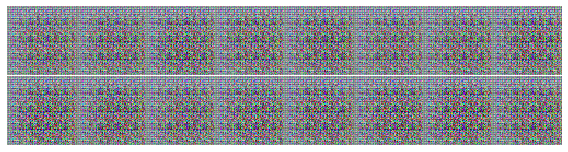

     Batch 5/9 generator loss | discriminator loss : 14.236435 | 1.8593884 - batch took 3.5201494693756104 s.
     Batch 6/9 generator loss | discriminator loss : 14.310915 | 1.924603 - batch took 2.8705341815948486 s.
     Batch 7/9 generator loss | discriminator loss : 14.236473 | 1.9981561 - batch took 2.9036409854888916 s.
     Batch 8/9 generator loss | discriminator loss : 14.659109 | 2.3215864 - batch took 2.8086209297180176 s.
     Batch 9/9 generator loss | discriminator loss : 14.495739 | 1.8385258 - batch took 2.8043932914733887 s.


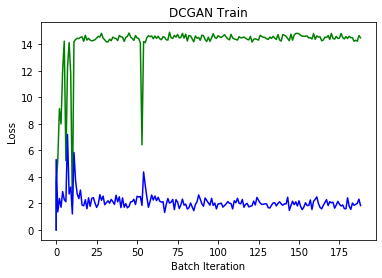

Epoch 22/50 :
     Batch 1/9 generator loss | discriminator loss : 14.411455 | 1.9403527 - batch took 2.814162254333496 s.
     Batch 2/9 generator loss | discriminator loss : 14.7311125 | 1.6763909 - batch took 2.736204147338867 s.
     Batch 3/9 generator loss | discriminator loss : 14.273949 | 1.9541426 - batch took 2.7783801555633545 s.
     Batch 4/9 generator loss | discriminator loss : 14.648193 | 1.4626445 - batch took 2.7964751720428467 s.


<Figure size 432x288 with 0 Axes>

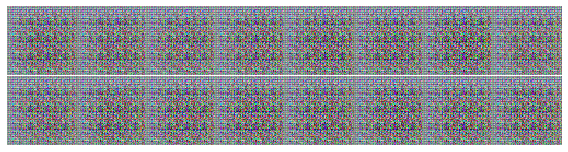

     Batch 5/9 generator loss | discriminator loss : 14.328439 | 2.1201675 - batch took 3.48384428024292 s.
     Batch 6/9 generator loss | discriminator loss : 14.342901 | 1.4175256 - batch took 2.8980417251586914 s.
     Batch 7/9 generator loss | discriminator loss : 14.564371 | 1.9420148 - batch took 2.7552311420440674 s.
     Batch 8/9 generator loss | discriminator loss : 14.508836 | 1.8907387 - batch took 2.759080648422241 s.
     Batch 9/9 generator loss | discriminator loss : 14.473789 | 2.149388 - batch took 2.858030080795288 s.


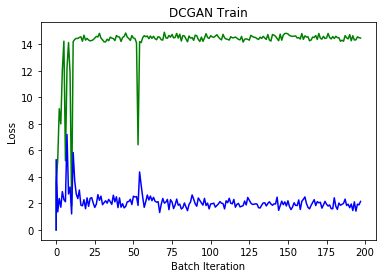

Epoch 23/50 :
     Batch 1/9 generator loss | discriminator loss : 14.367999 | 1.8804224 - batch took 2.791161298751831 s.
     Batch 2/9 generator loss | discriminator loss : 14.381491 | 1.8170755 - batch took 2.7775845527648926 s.
     Batch 3/9 generator loss | discriminator loss : 14.398825 | 2.0689034 - batch took 2.9012489318847656 s.
     Batch 4/9 generator loss | discriminator loss : 14.3542385 | 1.7404854 - batch took 2.76355242729187 s.


<Figure size 432x288 with 0 Axes>

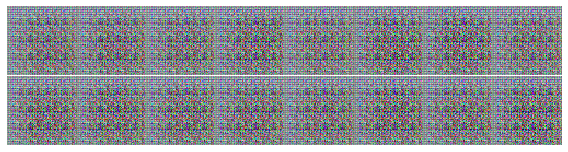

     Batch 5/9 generator loss | discriminator loss : 14.439007 | 1.9955245 - batch took 3.6748251914978027 s.
     Batch 6/9 generator loss | discriminator loss : 14.396818 | 1.9446329 - batch took 2.7791800498962402 s.
     Batch 7/9 generator loss | discriminator loss : 14.565007 | 1.9879502 - batch took 2.82904052734375 s.
     Batch 8/9 generator loss | discriminator loss : 14.514022 | 1.798604 - batch took 2.967707872390747 s.
     Batch 9/9 generator loss | discriminator loss : 14.474508 | 2.213743 - batch took 2.877537488937378 s.


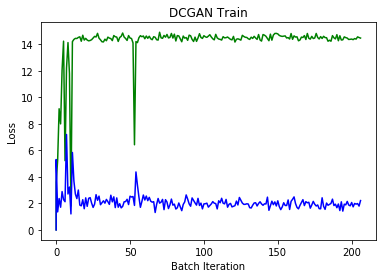

Epoch 24/50 :
     Batch 1/9 generator loss | discriminator loss : 14.418882 | 1.7113779 - batch took 2.899533271789551 s.
     Batch 2/9 generator loss | discriminator loss : 14.404457 | 2.252217 - batch took 2.8703765869140625 s.
     Batch 3/9 generator loss | discriminator loss : 14.440151 | 1.6737552 - batch took 2.7774410247802734 s.
     Batch 4/9 generator loss | discriminator loss : 14.542505 | 1.8666222 - batch took 2.7698919773101807 s.


<Figure size 432x288 with 0 Axes>

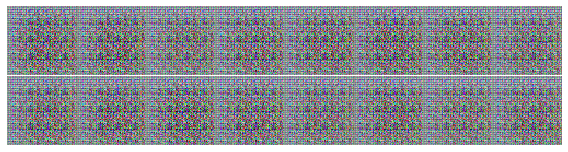

     Batch 5/9 generator loss | discriminator loss : 14.541893 | 2.3631172 - batch took 3.619948148727417 s.
     Batch 6/9 generator loss | discriminator loss : 14.556385 | 1.9461014 - batch took 2.9261629581451416 s.
     Batch 7/9 generator loss | discriminator loss : 14.483979 | 1.9148366 - batch took 2.7844045162200928 s.
     Batch 8/9 generator loss | discriminator loss : 14.598192 | 1.952574 - batch took 2.807979106903076 s.
     Batch 9/9 generator loss | discriminator loss : 14.579205 | 1.7685151 - batch took 2.7543132305145264 s.


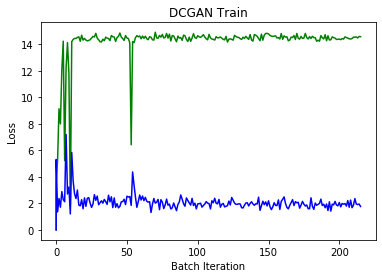

Epoch 25/50 :
     Batch 1/9 generator loss | discriminator loss : 14.371203 | 1.7134831 - batch took 2.756439208984375 s.
     Batch 2/9 generator loss | discriminator loss : 14.447403 | 2.08225 - batch took 2.796957492828369 s.
     Batch 3/9 generator loss | discriminator loss : 14.258148 | 1.8186775 - batch took 2.821023941040039 s.
     Batch 4/9 generator loss | discriminator loss : 14.574825 | 2.0623608 - batch took 2.792217969894409 s.


<Figure size 432x288 with 0 Axes>

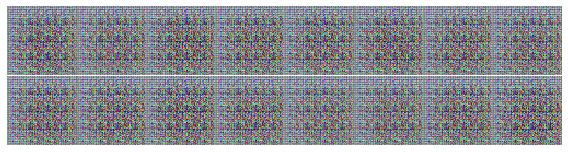

     Batch 5/9 generator loss | discriminator loss : 14.551559 | 2.0148454 - batch took 3.463121175765991 s.
     Batch 6/9 generator loss | discriminator loss : 14.623126 | 2.3502188 - batch took 2.966904401779175 s.
     Batch 7/9 generator loss | discriminator loss : 14.592657 | 2.125112 - batch took 2.7537615299224854 s.
     Batch 8/9 generator loss | discriminator loss : 14.402321 | 1.8514662 - batch took 2.7736473083496094 s.
     Batch 9/9 generator loss | discriminator loss : 14.802256 | 1.898064 - batch took 2.9139273166656494 s.


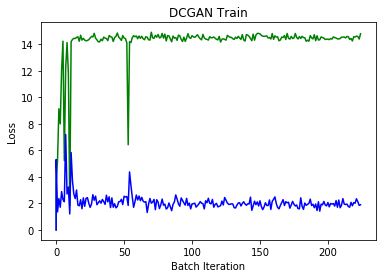

Epoch 26/50 :
     Batch 1/9 generator loss | discriminator loss : 14.509907 | 1.8201594 - batch took 2.868807792663574 s.
     Batch 2/9 generator loss | discriminator loss : 14.562536 | 2.0282032 - batch took 2.830150604248047 s.
     Batch 3/9 generator loss | discriminator loss : 14.550653 | 2.1254785 - batch took 2.793698787689209 s.
     Batch 4/9 generator loss | discriminator loss : 14.549245 | 1.6716744 - batch took 2.963339328765869 s.


<Figure size 432x288 with 0 Axes>

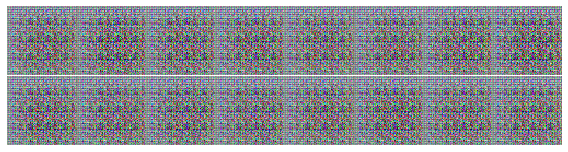

     Batch 5/9 generator loss | discriminator loss : 14.493957 | 1.8047646 - batch took 3.7125260829925537 s.
     Batch 6/9 generator loss | discriminator loss : 14.562593 | 2.1334636 - batch took 2.9896860122680664 s.
     Batch 7/9 generator loss | discriminator loss : 14.604328 | 1.3100927 - batch took 2.777785062789917 s.
     Batch 8/9 generator loss | discriminator loss : 14.53224 | 1.850173 - batch took 2.7867753505706787 s.
     Batch 9/9 generator loss | discriminator loss : 14.468874 | 1.909224 - batch took 2.779259204864502 s.


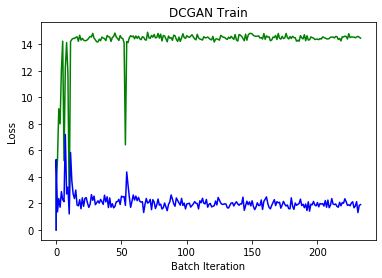

Epoch 27/50 :
     Batch 1/9 generator loss | discriminator loss : 14.689838 | 1.934564 - batch took 2.772210121154785 s.
     Batch 2/9 generator loss | discriminator loss : 14.398753 | 1.8727634 - batch took 2.7460479736328125 s.
     Batch 3/9 generator loss | discriminator loss : 14.615116 | 2.4939523 - batch took 2.8011202812194824 s.
     Batch 4/9 generator loss | discriminator loss : 14.590908 | 2.2309744 - batch took 2.749897003173828 s.


<Figure size 432x288 with 0 Axes>

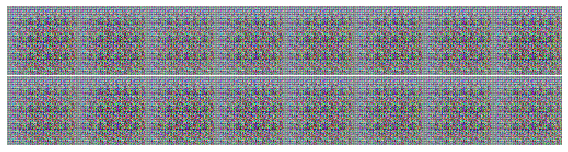

     Batch 5/9 generator loss | discriminator loss : 14.537439 | 2.1058621 - batch took 3.458165407180786 s.
     Batch 6/9 generator loss | discriminator loss : 14.730941 | 2.2934113 - batch took 2.915950298309326 s.
     Batch 7/9 generator loss | discriminator loss : 14.220137 | 2.1719108 - batch took 2.792693614959717 s.
     Batch 8/9 generator loss | discriminator loss : 14.184156 | 2.2815666 - batch took 2.786789655685425 s.
     Batch 9/9 generator loss | discriminator loss : 14.248415 | 2.020901 - batch took 2.8154306411743164 s.


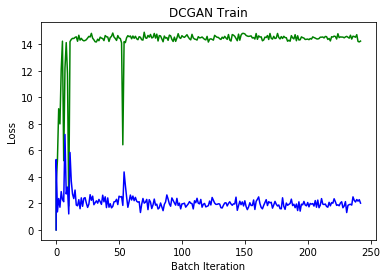

Epoch 28/50 :
     Batch 1/9 generator loss | discriminator loss : 14.962973 | 1.9061575 - batch took 2.793264389038086 s.
     Batch 2/9 generator loss | discriminator loss : 14.366499 | 1.5724639 - batch took 2.760530710220337 s.
     Batch 3/9 generator loss | discriminator loss : 14.412725 | 2.0257924 - batch took 2.79050350189209 s.
     Batch 4/9 generator loss | discriminator loss : 14.749912 | 1.4820294 - batch took 2.7860913276672363 s.


<Figure size 432x288 with 0 Axes>

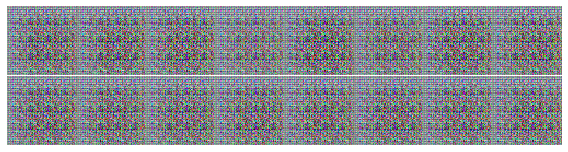

     Batch 5/9 generator loss | discriminator loss : 14.733319 | 2.0336645 - batch took 3.47932505607605 s.
     Batch 6/9 generator loss | discriminator loss : 14.563124 | 1.5870534 - batch took 2.885828971862793 s.
     Batch 7/9 generator loss | discriminator loss : 14.678568 | 2.1753337 - batch took 2.7940287590026855 s.
     Batch 8/9 generator loss | discriminator loss : 14.544168 | 2.165388 - batch took 2.8050267696380615 s.
     Batch 9/9 generator loss | discriminator loss : 14.798661 | 1.9650327 - batch took 2.796947479248047 s.


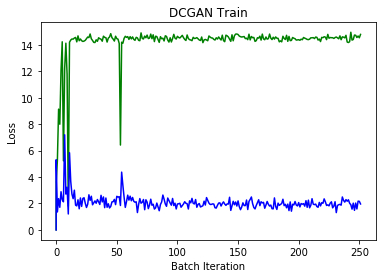

Epoch 29/50 :
     Batch 1/9 generator loss | discriminator loss : 14.588682 | 1.8900427 - batch took 2.7522788047790527 s.
     Batch 2/9 generator loss | discriminator loss : 14.610626 | 2.2388752 - batch took 2.741436719894409 s.
     Batch 3/9 generator loss | discriminator loss : 14.44989 | 1.6492462 - batch took 2.790149450302124 s.
     Batch 4/9 generator loss | discriminator loss : 14.622874 | 2.5036051 - batch took 2.7709808349609375 s.


<Figure size 432x288 with 0 Axes>

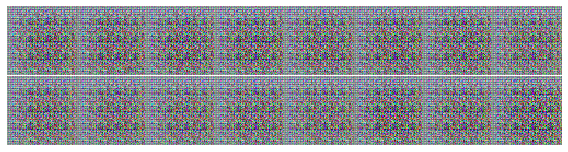

     Batch 5/9 generator loss | discriminator loss : 14.5628805 | 2.020608 - batch took 3.6692113876342773 s.
     Batch 6/9 generator loss | discriminator loss : 14.542551 | 1.8810469 - batch took 2.882887125015259 s.
     Batch 7/9 generator loss | discriminator loss : 14.270414 | 1.7004962 - batch took 2.836639404296875 s.
     Batch 8/9 generator loss | discriminator loss : 14.573991 | 2.2001395 - batch took 2.927022933959961 s.
     Batch 9/9 generator loss | discriminator loss : 14.679302 | 2.2052376 - batch took 2.9520435333251953 s.


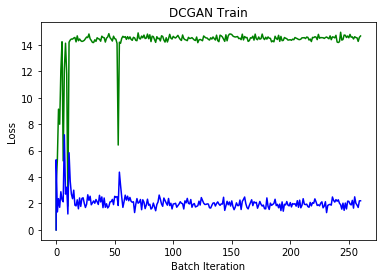

Epoch 30/50 :
     Batch 1/9 generator loss | discriminator loss : 14.414846 | 2.1263285 - batch took 2.8609719276428223 s.
     Batch 2/9 generator loss | discriminator loss : 14.394555 | 1.7451266 - batch took 2.8883748054504395 s.
     Batch 3/9 generator loss | discriminator loss : 14.261696 | 2.0398183 - batch took 2.7696120738983154 s.
     Batch 4/9 generator loss | discriminator loss : 14.223684 | 1.974579 - batch took 2.779818058013916 s.


<Figure size 432x288 with 0 Axes>

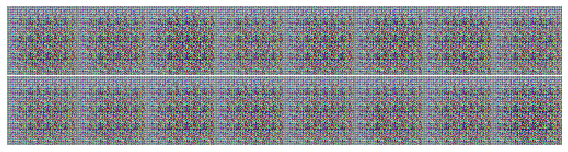

     Batch 5/9 generator loss | discriminator loss : 14.390588 | 2.2079692 - batch took 3.52285099029541 s.
     Batch 6/9 generator loss | discriminator loss : 14.587738 | 2.107675 - batch took 2.9294891357421875 s.
     Batch 7/9 generator loss | discriminator loss : 14.452711 | 1.6033852 - batch took 2.771740436553955 s.
     Batch 8/9 generator loss | discriminator loss : 14.351896 | 2.0368 - batch took 2.82435941696167 s.
     Batch 9/9 generator loss | discriminator loss : 14.617471 | 1.584285 - batch took 2.797724962234497 s.


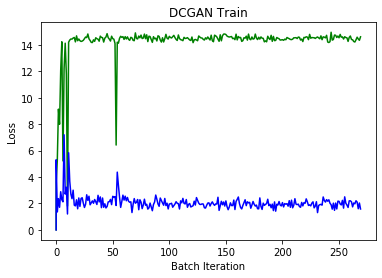

Epoch 31/50 :
     Batch 1/9 generator loss | discriminator loss : 14.608083 | 1.8133887 - batch took 2.988072633743286 s.
     Batch 2/9 generator loss | discriminator loss : 14.348698 | 1.8532398 - batch took 2.749817371368408 s.
     Batch 3/9 generator loss | discriminator loss : 14.45598 | 1.9866812 - batch took 2.884352684020996 s.
     Batch 4/9 generator loss | discriminator loss : 14.176501 | 2.0370607 - batch took 2.993738889694214 s.


<Figure size 432x288 with 0 Axes>

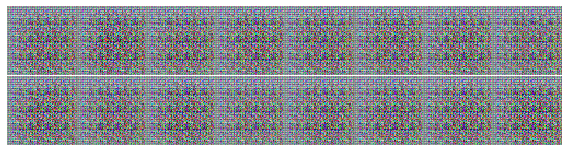

     Batch 5/9 generator loss | discriminator loss : 14.662794 | 1.9977263 - batch took 3.4767045974731445 s.
     Batch 6/9 generator loss | discriminator loss : 14.497425 | 2.0010803 - batch took 3.0900495052337646 s.
     Batch 7/9 generator loss | discriminator loss : 14.408775 | 1.994118 - batch took 2.770430088043213 s.
     Batch 8/9 generator loss | discriminator loss : 14.481634 | 1.6544856 - batch took 2.896285057067871 s.
     Batch 9/9 generator loss | discriminator loss : 14.550966 | 2.117437 - batch took 3.0070505142211914 s.


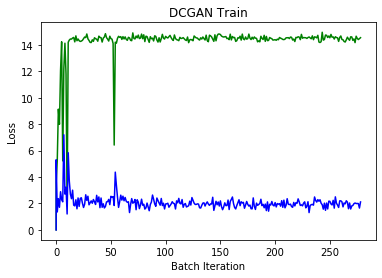

Epoch 32/50 :
     Batch 1/9 generator loss | discriminator loss : 14.314823 | 2.051104 - batch took 2.8597118854522705 s.
     Batch 2/9 generator loss | discriminator loss : 14.764962 | 2.0886495 - batch took 3.0191445350646973 s.
     Batch 3/9 generator loss | discriminator loss : 14.455439 | 2.107677 - batch took 2.9351260662078857 s.
     Batch 4/9 generator loss | discriminator loss : 14.765106 | 1.8243821 - batch took 2.784393548965454 s.


<Figure size 432x288 with 0 Axes>

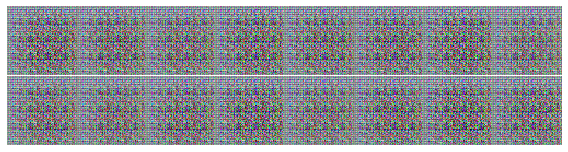

     Batch 5/9 generator loss | discriminator loss : 14.430384 | 1.5550611 - batch took 3.473794460296631 s.
     Batch 6/9 generator loss | discriminator loss : 14.678459 | 1.9978926 - batch took 2.8887743949890137 s.
     Batch 7/9 generator loss | discriminator loss : 14.294809 | 2.4439182 - batch took 2.767778158187866 s.
     Batch 8/9 generator loss | discriminator loss : 14.44317 | 1.7900807 - batch took 2.838062047958374 s.
     Batch 9/9 generator loss | discriminator loss : 14.663551 | 1.7580807 - batch took 2.795659303665161 s.


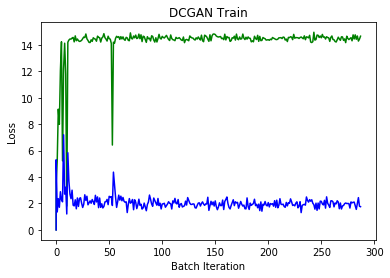

Epoch 33/50 :
     Batch 1/9 generator loss | discriminator loss : 14.5645275 | 2.2224827 - batch took 2.822584867477417 s.
     Batch 2/9 generator loss | discriminator loss : 14.488779 | 2.0957675 - batch took 2.735600233078003 s.
     Batch 3/9 generator loss | discriminator loss : 14.790844 | 1.8669521 - batch took 2.8202054500579834 s.
     Batch 4/9 generator loss | discriminator loss : 14.440943 | 1.2983947 - batch took 2.7823212146759033 s.


<Figure size 432x288 with 0 Axes>

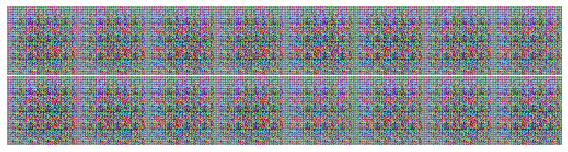

     Batch 5/9 generator loss | discriminator loss : 14.463057 | 1.9870378 - batch took 3.675217628479004 s.
     Batch 6/9 generator loss | discriminator loss : 14.605637 | 1.9595705 - batch took 2.8547136783599854 s.
     Batch 7/9 generator loss | discriminator loss : 14.571793 | 1.8201349 - batch took 2.7467117309570312 s.
     Batch 8/9 generator loss | discriminator loss : 14.322211 | 1.9297857 - batch took 2.74969482421875 s.
     Batch 9/9 generator loss | discriminator loss : 14.483019 | 1.6937823 - batch took 2.767357587814331 s.


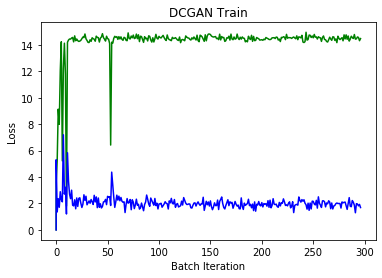

Epoch 34/50 :
     Batch 1/9 generator loss | discriminator loss : 14.491511 | 2.4274971 - batch took 2.7654833793640137 s.
     Batch 2/9 generator loss | discriminator loss : 14.544281 | 1.5664686 - batch took 2.7449121475219727 s.
     Batch 3/9 generator loss | discriminator loss : 14.397606 | 2.0865498 - batch took 2.789623260498047 s.
     Batch 4/9 generator loss | discriminator loss : 14.602064 | 2.1594791 - batch took 2.838270902633667 s.


<Figure size 432x288 with 0 Axes>

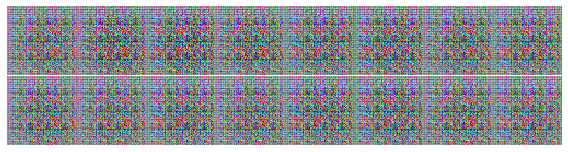

     Batch 5/9 generator loss | discriminator loss : 14.470413 | 2.1363237 - batch took 3.485445976257324 s.
     Batch 6/9 generator loss | discriminator loss : 14.782131 | 1.4449663 - batch took 2.9437315464019775 s.
     Batch 7/9 generator loss | discriminator loss : 14.557636 | 1.9987069 - batch took 2.9575753211975098 s.
     Batch 8/9 generator loss | discriminator loss : 14.305825 | 2.1821365 - batch took 2.921659231185913 s.
     Batch 9/9 generator loss | discriminator loss : 14.756287 | 1.5068564 - batch took 2.791735887527466 s.


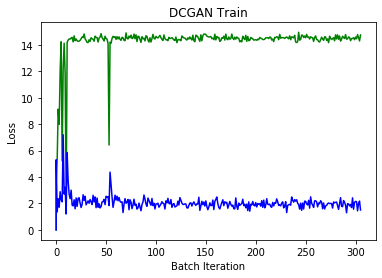

Epoch 35/50 :
     Batch 1/9 generator loss | discriminator loss : 14.630168 | 1.8902776 - batch took 2.7937023639678955 s.
     Batch 2/9 generator loss | discriminator loss : 14.266139 | 2.1706505 - batch took 2.769246816635132 s.
     Batch 3/9 generator loss | discriminator loss : 14.37517 | 1.6157062 - batch took 2.798924207687378 s.
     Batch 4/9 generator loss | discriminator loss : 14.355844 | 2.1490664 - batch took 2.807593584060669 s.


<Figure size 432x288 with 0 Axes>

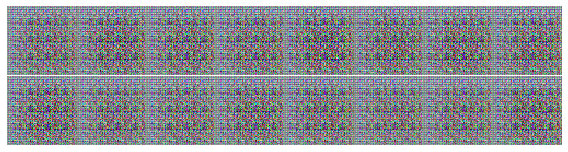

     Batch 5/9 generator loss | discriminator loss : 14.2922325 | 1.9659973 - batch took 3.4532299041748047 s.
     Batch 6/9 generator loss | discriminator loss : 14.615034 | 1.8697678 - batch took 2.8586878776550293 s.
     Batch 7/9 generator loss | discriminator loss : 14.404249 | 1.788558 - batch took 2.779827356338501 s.
     Batch 8/9 generator loss | discriminator loss : 14.377859 | 1.9008815 - batch took 2.75238037109375 s.
     Batch 9/9 generator loss | discriminator loss : 14.51792 | 1.5685368 - batch took 2.79712176322937 s.


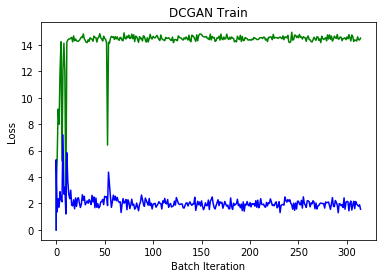

Epoch 36/50 :
     Batch 1/9 generator loss | discriminator loss : 14.654081 | 2.1110911 - batch took 2.785348415374756 s.
     Batch 2/9 generator loss | discriminator loss : 14.705056 | 2.115451 - batch took 2.777590751647949 s.
     Batch 3/9 generator loss | discriminator loss : 14.6558895 | 1.9424357 - batch took 2.7851364612579346 s.
     Batch 4/9 generator loss | discriminator loss : 14.652374 | 2.2304282 - batch took 2.976283550262451 s.


<Figure size 432x288 with 0 Axes>

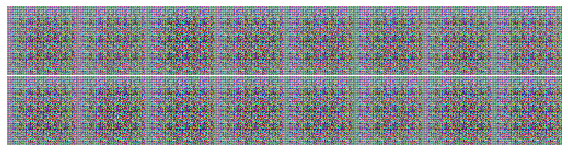

     Batch 5/9 generator loss | discriminator loss : 14.347458 | 2.0073774 - batch took 3.7003390789031982 s.
     Batch 6/9 generator loss | discriminator loss : 14.641117 | 2.2100694 - batch took 2.803487539291382 s.
     Batch 7/9 generator loss | discriminator loss : 14.364673 | 2.1276078 - batch took 2.793444871902466 s.
     Batch 8/9 generator loss | discriminator loss : 14.220125 | 1.740713 - batch took 2.7867002487182617 s.
     Batch 9/9 generator loss | discriminator loss : 14.451242 | 2.0603657 - batch took 3.0157711505889893 s.


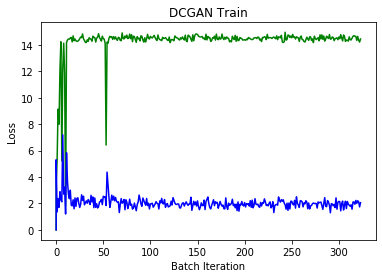

Epoch 37/50 :
     Batch 1/9 generator loss | discriminator loss : 14.514915 | 1.5157768 - batch took 2.839620590209961 s.
     Batch 2/9 generator loss | discriminator loss : 14.499681 | 2.2003255 - batch took 2.797023057937622 s.
     Batch 3/9 generator loss | discriminator loss : 14.4159565 | 1.8867408 - batch took 2.9023494720458984 s.
     Batch 4/9 generator loss | discriminator loss : 14.183921 | 2.4393125 - batch took 2.9229211807250977 s.


<Figure size 432x288 with 0 Axes>

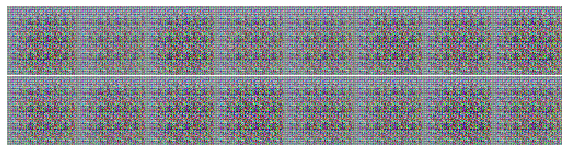

     Batch 5/9 generator loss | discriminator loss : 14.419768 | 1.9247265 - batch took 3.505891799926758 s.
     Batch 6/9 generator loss | discriminator loss : 14.770077 | 2.2949433 - batch took 2.8884828090667725 s.
     Batch 7/9 generator loss | discriminator loss : 14.099255 | 1.5798584 - batch took 2.8779122829437256 s.
     Batch 8/9 generator loss | discriminator loss : 14.473751 | 1.3953578 - batch took 2.9433131217956543 s.
     Batch 9/9 generator loss | discriminator loss : 14.424194 | 2.2498112 - batch took 2.929328441619873 s.


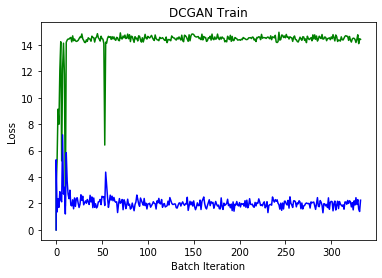

Epoch 38/50 :
     Batch 1/9 generator loss | discriminator loss : 14.566027 | 1.9511476 - batch took 2.8111841678619385 s.
     Batch 2/9 generator loss | discriminator loss : 14.573844 | 1.9051789 - batch took 2.78320050239563 s.
     Batch 3/9 generator loss | discriminator loss : 14.465596 | 2.0882752 - batch took 2.8138818740844727 s.
     Batch 4/9 generator loss | discriminator loss : 14.58395 | 2.436754 - batch took 2.7701146602630615 s.


<Figure size 432x288 with 0 Axes>

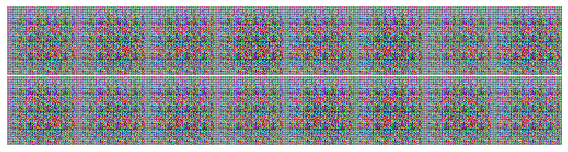

     Batch 5/9 generator loss | discriminator loss : 14.539283 | 1.7523389 - batch took 3.4641973972320557 s.
     Batch 6/9 generator loss | discriminator loss : 14.573462 | 1.6385927 - batch took 2.8293702602386475 s.
     Batch 7/9 generator loss | discriminator loss : 14.433748 | 2.0982745 - batch took 2.776183843612671 s.
     Batch 8/9 generator loss | discriminator loss : 14.5666485 | 2.0157223 - batch took 2.7792129516601562 s.
     Batch 9/9 generator loss | discriminator loss : 14.342236 | 1.7976716 - batch took 2.9242358207702637 s.


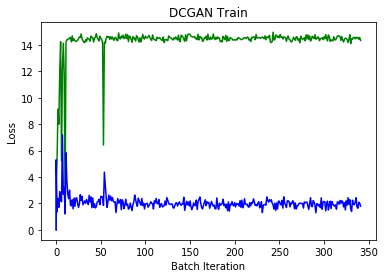

Epoch 39/50 :
     Batch 1/9 generator loss | discriminator loss : 14.479303 | 2.121843 - batch took 2.9282705783843994 s.
     Batch 2/9 generator loss | discriminator loss : 14.4246235 | 2.0622056 - batch took 2.7666993141174316 s.
     Batch 3/9 generator loss | discriminator loss : 14.481852 | 1.5512595 - batch took 2.827005624771118 s.
     Batch 4/9 generator loss | discriminator loss : 14.324371 | 1.9473599 - batch took 2.774198293685913 s.


<Figure size 432x288 with 0 Axes>

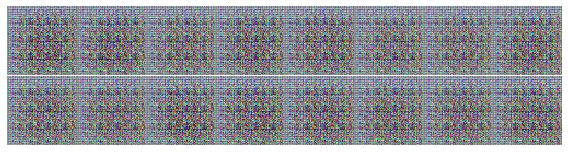

     Batch 5/9 generator loss | discriminator loss : 14.479595 | 2.3973913 - batch took 3.677293300628662 s.
     Batch 6/9 generator loss | discriminator loss : 13.750371 | 2.0796027 - batch took 2.9785959720611572 s.
     Batch 7/9 generator loss | discriminator loss : 0.34417015 | 0.7793088 - batch took 2.8166744709014893 s.
     Batch 8/9 generator loss | discriminator loss : 14.363571 | 4.6007557 - batch took 2.8424110412597656 s.
     Batch 9/9 generator loss | discriminator loss : 14.284567 | 5.4779706 - batch took 2.8127596378326416 s.


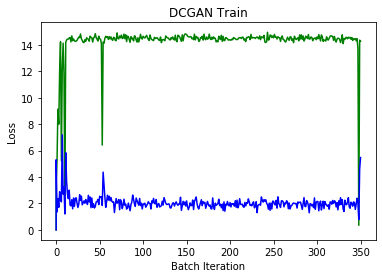

Epoch 40/50 :
     Batch 1/9 generator loss | discriminator loss : 10.843891 | 2.5348735 - batch took 2.869516372680664 s.
     Batch 2/9 generator loss | discriminator loss : 12.776649 | 2.6500192 - batch took 2.9420671463012695 s.
     Batch 3/9 generator loss | discriminator loss : 6.0144825 | 3.8375816 - batch took 2.8424246311187744 s.
     Batch 4/9 generator loss | discriminator loss : 14.362712 | 8.075365 - batch took 2.8187053203582764 s.


<Figure size 432x288 with 0 Axes>

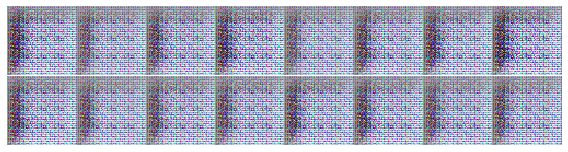

     Batch 5/9 generator loss | discriminator loss : 14.418798 | 2.176851 - batch took 3.523263454437256 s.
     Batch 6/9 generator loss | discriminator loss : 14.108684 | 2.6158996 - batch took 2.8718252182006836 s.
     Batch 7/9 generator loss | discriminator loss : 13.184128 | 2.637781 - batch took 2.795685052871704 s.
     Batch 8/9 generator loss | discriminator loss : 2.8771715 | 1.2704457 - batch took 2.809359550476074 s.
     Batch 9/9 generator loss | discriminator loss : 6.4437056 | 3.4697075 - batch took 3.0295655727386475 s.


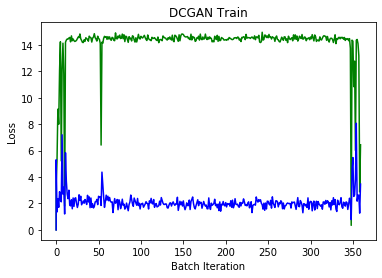

Epoch 41/50 :
     Batch 1/9 generator loss | discriminator loss : 5.85373 | 1.5397344 - batch took 2.9719128608703613 s.
     Batch 2/9 generator loss | discriminator loss : 7.213133 | 4.2312217 - batch took 3.076315402984619 s.
     Batch 3/9 generator loss | discriminator loss : 5.4446416 | 2.598991 - batch took 2.854912757873535 s.
     Batch 4/9 generator loss | discriminator loss : 10.498389 | 3.1822422 - batch took 3.030451774597168 s.


<Figure size 432x288 with 0 Axes>

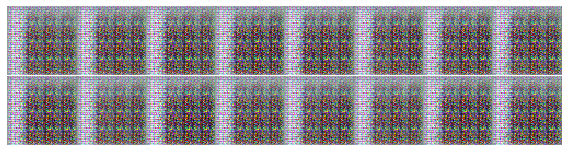

     Batch 5/9 generator loss | discriminator loss : 9.982435 | 2.6061268 - batch took 3.6568620204925537 s.
     Batch 6/9 generator loss | discriminator loss : 5.8026314 | 1.5443592 - batch took 2.9130465984344482 s.
     Batch 7/9 generator loss | discriminator loss : 9.288652 | 2.260962 - batch took 2.8619794845581055 s.
     Batch 8/9 generator loss | discriminator loss : 4.620579 | 1.4770542 - batch took 2.8423702716827393 s.
     Batch 9/9 generator loss | discriminator loss : 9.942955 | 5.505038 - batch took 2.838426113128662 s.


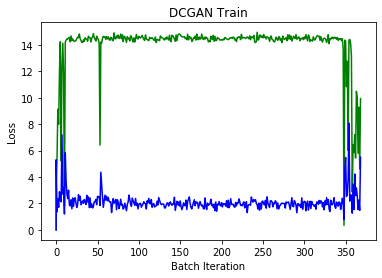

Epoch 42/50 :
     Batch 1/9 generator loss | discriminator loss : 13.58374 | 2.4801452 - batch took 2.8123984336853027 s.
     Batch 2/9 generator loss | discriminator loss : 8.217221 | 2.0693188 - batch took 2.920780897140503 s.
     Batch 3/9 generator loss | discriminator loss : 10.7697315 | 2.9571137 - batch took 2.8520328998565674 s.
     Batch 4/9 generator loss | discriminator loss : 11.078885 | 2.2011116 - batch took 2.8386499881744385 s.


<Figure size 432x288 with 0 Axes>

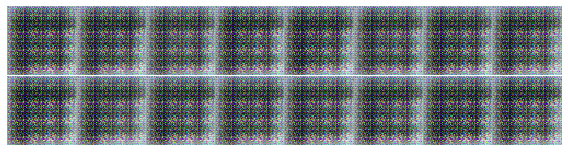

     Batch 5/9 generator loss | discriminator loss : 6.7987146 | 1.748989 - batch took 3.4953978061676025 s.
     Batch 6/9 generator loss | discriminator loss : 2.6788442 | 1.1311898 - batch took 2.9167356491088867 s.
     Batch 7/9 generator loss | discriminator loss : 2.512909 | 1.2978216 - batch took 2.826725959777832 s.
     Batch 8/9 generator loss | discriminator loss : 1.6698892 | 1.2651107 - batch took 2.8368947505950928 s.
     Batch 9/9 generator loss | discriminator loss : 3.3980212 | 1.710821 - batch took 2.8484785556793213 s.


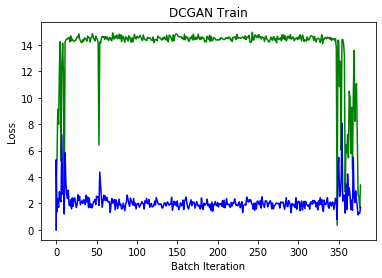

Epoch 43/50 :
     Batch 1/9 generator loss | discriminator loss : 2.338356 | 1.1518917 - batch took 2.8309848308563232 s.
     Batch 2/9 generator loss | discriminator loss : 2.4621296 | 1.0843623 - batch took 2.8195955753326416 s.
     Batch 3/9 generator loss | discriminator loss : 2.2293773 | 0.7432971 - batch took 2.7932393550872803 s.
     Batch 4/9 generator loss | discriminator loss : 2.775303 | 0.75442094 - batch took 2.780580997467041 s.


<Figure size 432x288 with 0 Axes>

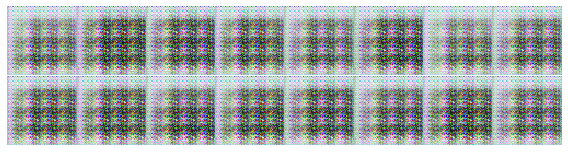

     Batch 5/9 generator loss | discriminator loss : 2.504837 | 0.7694373 - batch took 3.9306139945983887 s.
     Batch 6/9 generator loss | discriminator loss : 3.7719102 | 0.8411293 - batch took 2.931957960128784 s.
     Batch 7/9 generator loss | discriminator loss : 1.937732 | 0.9405073 - batch took 2.8367373943328857 s.
     Batch 8/9 generator loss | discriminator loss : 5.7920337 | 1.3015234 - batch took 3.0259509086608887 s.
     Batch 9/9 generator loss | discriminator loss : 5.888812 | 1.2732577 - batch took 2.8660037517547607 s.


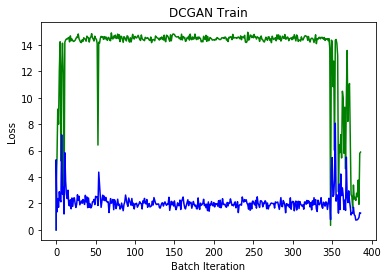

Epoch 44/50 :
     Batch 1/9 generator loss | discriminator loss : 3.2393947 | 0.78789604 - batch took 2.8091490268707275 s.
     Batch 2/9 generator loss | discriminator loss : 1.8252075 | 0.79846257 - batch took 2.8098294734954834 s.
     Batch 3/9 generator loss | discriminator loss : 2.274379 | 0.77793264 - batch took 2.8472509384155273 s.
     Batch 4/9 generator loss | discriminator loss : 2.3169582 | 0.6916065 - batch took 3.1604228019714355 s.


<Figure size 432x288 with 0 Axes>

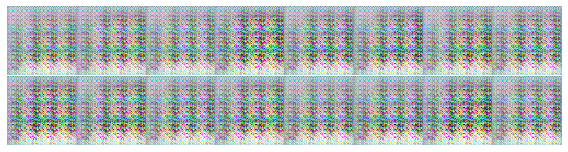

     Batch 5/9 generator loss | discriminator loss : 2.0570617 | 0.6900903 - batch took 3.5022339820861816 s.
     Batch 6/9 generator loss | discriminator loss : 2.0024786 | 0.87237215 - batch took 2.953550100326538 s.
     Batch 7/9 generator loss | discriminator loss : 2.4353933 | 0.7283021 - batch took 2.9553139209747314 s.
     Batch 8/9 generator loss | discriminator loss : 2.2003818 | 0.7390027 - batch took 2.9630022048950195 s.
     Batch 9/9 generator loss | discriminator loss : 2.3924923 | 0.80183065 - batch took 2.968715190887451 s.


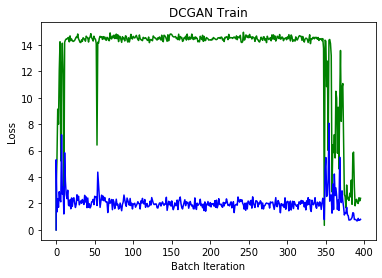

Epoch 45/50 :
     Batch 1/9 generator loss | discriminator loss : 2.0174775 | 0.8830346 - batch took 2.82519793510437 s.
     Batch 2/9 generator loss | discriminator loss : 2.6920419 | 0.83940935 - batch took 2.917840003967285 s.
     Batch 3/9 generator loss | discriminator loss : 2.557911 | 0.71073425 - batch took 2.9187278747558594 s.
     Batch 4/9 generator loss | discriminator loss : 8.927931 | 1.1408274 - batch took 2.82283616065979 s.


<Figure size 432x288 with 0 Axes>

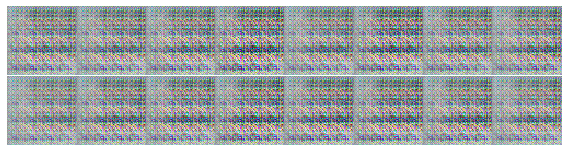

     Batch 5/9 generator loss | discriminator loss : 6.508913 | 1.6936675 - batch took 3.5853867530822754 s.
     Batch 6/9 generator loss | discriminator loss : 2.5042067 | 0.86114925 - batch took 3.1009936332702637 s.
     Batch 7/9 generator loss | discriminator loss : 2.2230625 | 0.87520564 - batch took 2.8546714782714844 s.
     Batch 8/9 generator loss | discriminator loss : 1.8209381 | 0.81009364 - batch took 2.8713200092315674 s.
     Batch 9/9 generator loss | discriminator loss : 6.1651154 | 1.6754351 - batch took 2.8824901580810547 s.


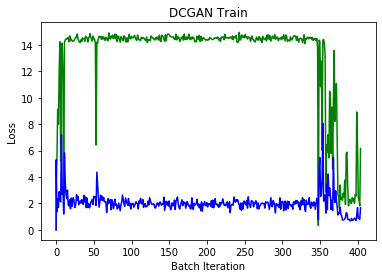

Epoch 46/50 :
     Batch 1/9 generator loss | discriminator loss : 3.0650568 | 2.2521122 - batch took 2.8400304317474365 s.
     Batch 2/9 generator loss | discriminator loss : 2.342349 | 0.96517944 - batch took 2.8042595386505127 s.
     Batch 3/9 generator loss | discriminator loss : 2.70999 | 0.7339655 - batch took 2.8826231956481934 s.
     Batch 4/9 generator loss | discriminator loss : 2.7721844 | 0.97490245 - batch took 3.0902421474456787 s.


<Figure size 432x288 with 0 Axes>

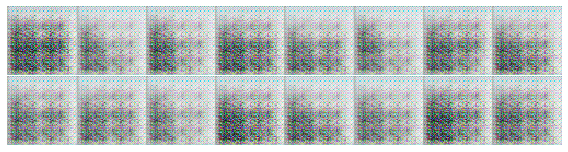

     Batch 5/9 generator loss | discriminator loss : 2.518619 | 0.72583467 - batch took 3.741753578186035 s.
     Batch 6/9 generator loss | discriminator loss : 3.8707201 | 1.1941316 - batch took 2.8091819286346436 s.
     Batch 7/9 generator loss | discriminator loss : 2.3058898 | 0.8708732 - batch took 2.862543821334839 s.
     Batch 8/9 generator loss | discriminator loss : 4.5391445 | 1.1449653 - batch took 2.777310371398926 s.
     Batch 9/9 generator loss | discriminator loss : 3.728531 | 1.3472457 - batch took 2.816847801208496 s.


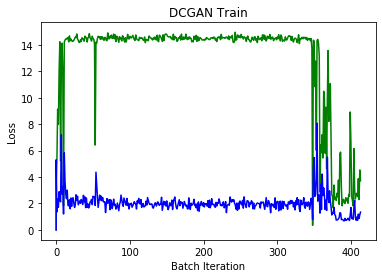

Epoch 47/50 :
     Batch 1/9 generator loss | discriminator loss : 1.9071574 | 0.7858437 - batch took 2.8131988048553467 s.
     Batch 2/9 generator loss | discriminator loss : 2.1058502 | 0.83389115 - batch took 2.78865122795105 s.
     Batch 3/9 generator loss | discriminator loss : 2.1081195 | 0.97470105 - batch took 2.7859814167022705 s.
     Batch 4/9 generator loss | discriminator loss : 2.0040886 | 0.7963707 - batch took 2.916536331176758 s.


<Figure size 432x288 with 0 Axes>

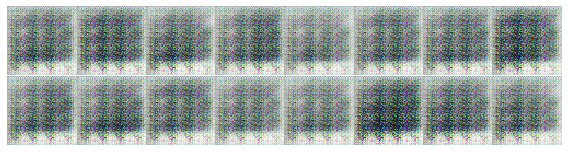

     Batch 5/9 generator loss | discriminator loss : 2.1656046 | 0.72011435 - batch took 3.5521082878112793 s.
     Batch 6/9 generator loss | discriminator loss : 1.8478253 | 0.7745253 - batch took 2.8683364391326904 s.
     Batch 7/9 generator loss | discriminator loss : 1.7665322 | 0.8463616 - batch took 2.8420379161834717 s.
     Batch 8/9 generator loss | discriminator loss : 2.417879 | 0.7371639 - batch took 2.8039298057556152 s.
     Batch 9/9 generator loss | discriminator loss : 2.2124574 | 0.68004423 - batch took 2.984673500061035 s.


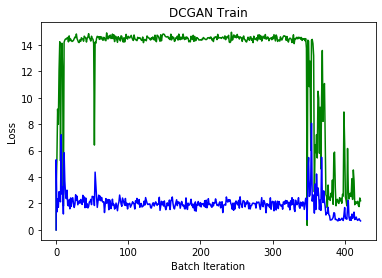

Epoch 48/50 :
     Batch 1/9 generator loss | discriminator loss : 1.8220303 | 0.8066101 - batch took 2.8864786624908447 s.
     Batch 2/9 generator loss | discriminator loss : 1.9715426 | 0.73769104 - batch took 2.823643922805786 s.
     Batch 3/9 generator loss | discriminator loss : 1.5133725 | 0.7511607 - batch took 2.9291610717773438 s.
     Batch 4/9 generator loss | discriminator loss : 3.3633022 | 1.062051 - batch took 2.8748881816864014 s.


<Figure size 432x288 with 0 Axes>

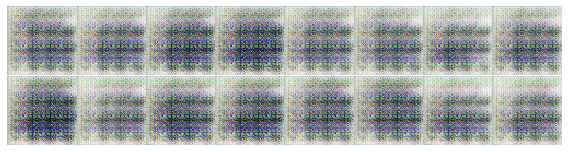

     Batch 5/9 generator loss | discriminator loss : 1.7987256 | 1.0522176 - batch took 3.666980504989624 s.
     Batch 6/9 generator loss | discriminator loss : 3.2614386 | 1.0589395 - batch took 3.0078418254852295 s.
     Batch 7/9 generator loss | discriminator loss : 1.6530292 | 1.1805869 - batch took 2.842357635498047 s.
     Batch 8/9 generator loss | discriminator loss : 2.5952582 | 0.96512675 - batch took 2.815511703491211 s.
     Batch 9/9 generator loss | discriminator loss : 2.4200945 | 0.757069 - batch took 2.8243651390075684 s.


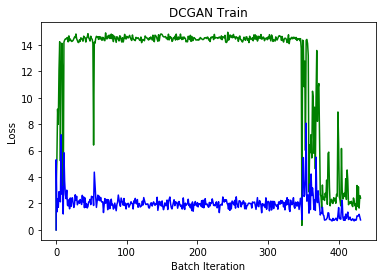

Epoch 49/50 :
     Batch 1/9 generator loss | discriminator loss : 1.7998195 | 0.9178519 - batch took 2.9258649349212646 s.
     Batch 2/9 generator loss | discriminator loss : 2.3458385 | 0.7462479 - batch took 2.8441245555877686 s.
     Batch 3/9 generator loss | discriminator loss : 1.7051063 | 0.8904637 - batch took 2.891138792037964 s.
     Batch 4/9 generator loss | discriminator loss : 2.227612 | 0.7400998 - batch took 2.8592896461486816 s.


<Figure size 432x288 with 0 Axes>

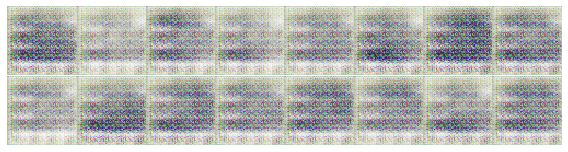

     Batch 5/9 generator loss | discriminator loss : 1.9008597 | 0.833843 - batch took 3.6997082233428955 s.
     Batch 6/9 generator loss | discriminator loss : 2.058399 | 0.7318492 - batch took 2.8694875240325928 s.
     Batch 7/9 generator loss | discriminator loss : 2.161591 | 0.7435888 - batch took 2.8564200401306152 s.
     Batch 8/9 generator loss | discriminator loss : 3.350313 | 1.247286 - batch took 2.8323636054992676 s.
     Batch 9/9 generator loss | discriminator loss : 2.0920076 | 1.2148566 - batch took 2.8117899894714355 s.


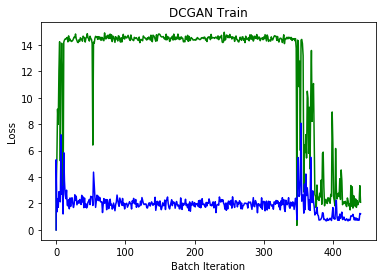

Epoch 50/50 :
     Batch 1/9 generator loss | discriminator loss : 3.2646308 | 1.0714111 - batch took 2.8610939979553223 s.
     Batch 2/9 generator loss | discriminator loss : 2.954109 | 0.8379929 - batch took 2.9167490005493164 s.
     Batch 3/9 generator loss | discriminator loss : 2.5388434 | 1.8838799 - batch took 2.964106321334839 s.
     Batch 4/9 generator loss | discriminator loss : 2.8913138 | 0.79464424 - batch took 2.7851908206939697 s.


<Figure size 432x288 with 0 Axes>

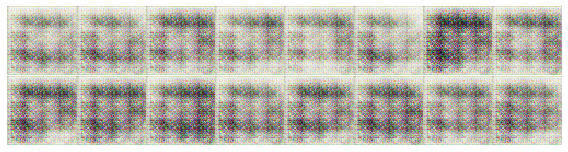

     Batch 5/9 generator loss | discriminator loss : 1.5455512 | 0.8487356 - batch took 3.48498272895813 s.
     Batch 6/9 generator loss | discriminator loss : 2.0401897 | 1.0118253 - batch took 2.923567295074463 s.
     Batch 7/9 generator loss | discriminator loss : 1.9567595 | 0.91391975 - batch took 2.819336175918579 s.
     Batch 8/9 generator loss | discriminator loss : 2.4899702 | 0.84521335 - batch took 2.771026134490967 s.
     Batch 9/9 generator loss | discriminator loss : 2.5225902 | 0.778373 - batch took 2.8326971530914307 s.


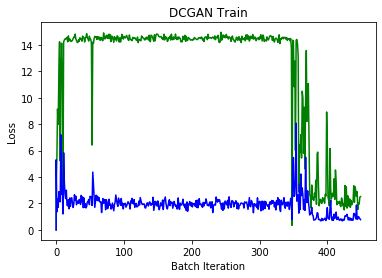

<Figure size 432x288 with 0 Axes>

In [10]:
print(path)
dataset_path = path
print(dataset_path)
batch_size = 16
image_shape = (64, 64, 3)
epochs = 50
train_dcgan(batch_size, epochs,image_shape, dataset_path)

